# Introduction to generative modelling; Variational Autoencoders

## Encoder-Decoder Architecture

Now, we will discuss how to use neural networks in an unsupervised learning context. In fact, it was the first common application of such models.

**Dimensionality reduction** is the transformation of data from a high-dimensional space into a low-dimensional space that retains the data's most important properties. **Autoencoder** is a type of neural network that solves this task using two components: **Encoder** network $f_{\theta} : \mathcal{X} \to \mathcal{Z}$ takes $n$-dimensional input variable $x \in \mathcal{X}$ and maps it into the $m$-dimensional **latent variables** space $z \in \mathcal{Z}$. **Decoder** $g_{\psi} : \mathcal{Z} \to \mathcal{X}$ reconstruct the latent variables into the input space:


[![](http://kvfrans.com/content/images/2016/08/autoenc.jpg)](http://kvfrans.com/variational-autoencoders-explained/)

In the most cases, we assume that $n>>m$, then we call autoencoder **undercomplete**. The training process is pretty straightforward, we minimize the loss function: 

$$L(x,g(f(x; \theta);\psi))$$

Loss function $L$ measures the distance between each point $x$ and its reconstruction $\tilde{x} = g(z;\psi)$.

The effectiveness of dimensionality reduction is often explained by  **Manifold hypothesis**. The manifold hypothesis states that the majority of high-dimensional data sets can actually be described by a rather small number of variables, likened to the local coordinate system of the underlying manifold:

[![](https://www.researchgate.net/profile/Y_Bengio/publication/221700451/figure/fig1/AS:305523212734474@1449853818623/Example-of-a-simple-manifold-in-the-space-of-images-associated-with-a-rather-low-level.png)](https://www.researchgate.net/figure/Example-of-a-simple-manifold-in-the-space-of-images-associated-with-a-rather-low-level_fig1_221700451/)

Let us show a simple example:

In [1]:
using Flux, MLDatasets
using Flux: mse, throttle, params, Statistics
using Base.Iterators: partition
using Printf, BSON, JLD2, LinearAlgebra
using Flux.Losses
using Plots; gr()
using CUDA

In [2]:
use_cuda = true

true

In [3]:
 if use_cuda && CUDA.functional()
    device = gpu
    @info "Training on GPU"
else
    device = cpu
    @info "Training on CPU"
end

[ Info: Training on GPU


In [4]:
train_set = MNIST(:train)
N, M = size(train_set.features, 3), 64
X = reshape(train_set.features,(28^2,N))
data = [X[:,i] for i in Iterators.partition(1:N,M)] |> device;

In [5]:
using Images

In [6]:
encoder = Chain(Dense(28^2, 256, leakyrelu),
                Dense(256, 32, leakyrelu))
    
decoder = Chain(Dense(32, 256, leakyrelu), 
                Dense(256, 28^2))

Chain(
  Dense(32 => 256, leakyrelu),          # 8_448 parameters
  Dense(256 => 784),                    # 201_488 parameters
)                   # Total: 4 arrays, 209_936 parameters, 820.266 KiB.

In [7]:
model = Chain(encoder, decoder) |> device
loss(model, x) = mse(model(x), x)
opt = Adam()
opt_state = Flux.setup(opt, model);

In [8]:
img(x::Vector) = Gray.(transpose(reshape(clamp.(x, 0, 1), 28, 28)))

function sample()
    before = [X[:,i] for i in rand(1:size(X,2), 4)] 
    after = map(x -> model(device(x)), before) |> cpu
    vcat(hcat.(img.(before), img.(after))...)
end

sample (generic function with 1 method)

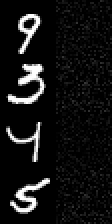

In [9]:
sample()

[ Info: Beginning training loop...
[ Info: Epoch 1


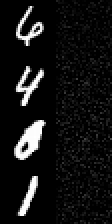

[ Info: Epoch 2


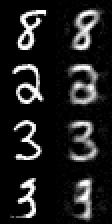

[ Info: Epoch 3


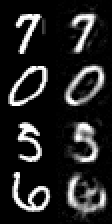

[ Info: Epoch 4


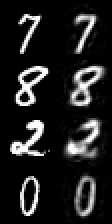

[ Info: Epoch 5


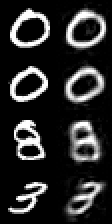

[ Info: Epoch 6


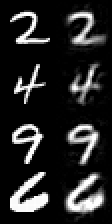

[ Info: Epoch 7


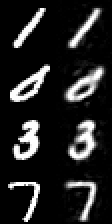

[ Info: Epoch 8


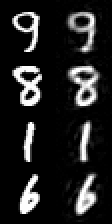

[ Info: Epoch 9


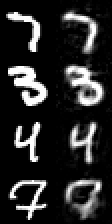

[ Info: Epoch 10


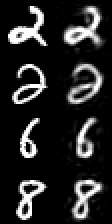

In [10]:
@info("Beginning training loop...")
best_ls = Inf
last_improvement = 0
for epoch = 1:10
    @info "Epoch $epoch"
    display(sample())
    global best_ls, last_improvement
    Flux.train!(loss, model, data, opt_state)
    ls = loss(model, data[1])
    if ls <= best_ls
        model_params = cpu(Flux.state(model))
        BSON.@save "enc_dec.bson" model_params 
        jldsave("enc_dec.jld2"; model_params)
        best_ls = ls
        last_improvement = epoch
    end
    if epoch - last_improvement >= 2
        @warn(" -> We're calling this converged.")
        break
    end
end

In [11]:
encoder = Chain(Dense(28^2, 256, leakyrelu),
                Dense(256, 32, leakyrelu))
    
decoder = Chain(Dense(32, 256, leakyrelu), 
                Dense(256, 28^2))

model = Chain(encoder, decoder) |> device

ps = JLD2.load("enc_dec.jld2", "model_params")

Flux.loadmodel!(model, device(ps))

Chain(
  Chain(
    Dense(784 => 256, leakyrelu),       # 200_960 parameters
    Dense(256 => 32, leakyrelu),        # 8_224 parameters
  ),
  Chain(
    Dense(32 => 256, leakyrelu),        # 8_448 parameters
    Dense(256 => 784),                  # 201_488 parameters
  ),
)                   # Total: 8 arrays, 419_120 parameters, 1.258 KiB.

In [12]:
encoder(X[:,1])

32-element Vector{Float32}:
  0.3350128
  0.090474404
  0.3999551
  0.16271709
  0.38108936
 -0.007034775
 -0.011597196
 -0.00592686
  0.08653764
  0.3660524
 -0.0040956633
  0.26173544
 -0.0031429725
  ⋮
 -0.0011663145
 -0.00030339102
 -0.0013828645
  0.08427813
  0.5581077
  0.5941019
 -0.0074401866
  0.60718805
 -0.0045413864
  0.3868178
  0.4121241
  0.37609747

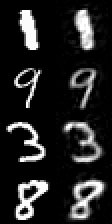

In [13]:
sample()

Different variants of Autoencoders can be used in many different applications: 

- They are effective dimensionality reduction/compression tools.
- They are able to learn non-trivial, non-linear space transformations that are unattainable with classic algorithms.
- They can drastically reduce the dimensionality with almost non-existent information loss 
- They can be used as encryption tools.
- They can denoise data.
- They can be used as generative models.

Now, we will discuss the relationship between autoencoders and generative modelling. Firstly, we could rewrite both, encoder and decoder as stochastic models, $f(x;\theta) = p_{encoder}(z|x;\theta)$ and $g(x;\psi) = p_{decoder}(x|z;\psi)$ respectively. Then, autoencoder model will be equal to:

$$p_{model}(x,z) = p_{encoder}(z|x; \theta)p_{decoder}(x|z; \psi)$$


Encoder can be easily trained by the **Maximum Likelihood Estimation** principle:

$$\hat{\theta} = \underset{\theta \in \Theta}{\text{argmax}}~p_{encoder}(z|x;\theta)$$

However, decoder's training is non-trivial; this problem cannot be solved directly, without enforcing any prior on latent variables $z$. Now, assume that a prior distribution $q$ over $z$ exists. Then we can estimate $z$ as the mode of the posterior distribution of this random variable using the **Maximum a Posteriori** estimation method: 

$$
\begin{split}
\hat{\psi}_{MAP} &= \underset{\psi \in \Psi}{\text{argmax}}~p_{decoder}(z|x;\psi) \\
&= \underset{\psi \in \Psi}{\text{argmax}}~p_{decoder}(x|z;\psi) ~ q(z) \\
&= \sum_{i=1}^n \log p_{decoder}(x|z;\psi) + \log q(z)
\end{split}
$$

This form of autoencoder is known as a **regularized autoencoder**. In a traditional framework such model is trained by adding the penalty (prior over latent variables) to the reconstruction error: 

$$L(x,g(f(x; \theta); \psi)) + \Omega(z)$$



##  Variational Autoencoder

[Variational Autoencoders](https://arxiv.org/pdf/1312.6114.pdf) are the class of autoencoders that works using a very simple principle; instead of embedding a variable $x$ as a latent vector $z$ they embed it in the form of a probability distribution (e.g. gaussian) parameters. Then encoder draws a sample from this distribution and reconstructs the new observation:

[![](http://kvfrans.com/content/images/2016/08/vae.jpg)](http://kvfrans.com/variational-autoencoders-explained/)

What are the principles behind such a network? 

Our goal is to approximate the probability distribution $p(x,z)$, that describes a data generating process: 

$$p(x,z) = p(x|z)p(z)$$

With such a model, we could easily generate new observations using two step procedure: 
1. Draw a latent vector $z_i  \sim p(z)$
2. Reconstruct the observation $\hat{x}_i \sim p(x|z)$

To find a solution, we must learn the relation between variables $x$ and latents $z$:

$$p(z|x) = \frac{p(x|z)p(z)}{p(x)}$$

It is impossible to find this probability analytically, namely solving an integral $p(x) = \int_\mathcal{Z} {p(x|z)p(z)}dz$ requires full knowledge about the space $\mathcal{Z}$. Instead, we can approximate $p(z|x)$ using a prior distribution $q_{\phi}(z|x)$ from a family of distributions $\phi$. With such assumption, our goal reduces to solving the following expectation:
$$E_{z \sim  q_{\phi}}[p(x | z)]$$ 

But how to measure the similarity of $q_{\phi}$ and $p$?

With **Kullback-Leibler divergence**:

$$d_{KL}(q_{\phi}(z|x)||p(z|x)) = E_{q_{\phi}}[\log q_{\phi}(z|x)] - E_{q_{\phi}}[\log p(x,z)] + \log p(x)$$

Then, our goal is to find such a distribution  $q_{\phi}^*$ than minimizes:

$$q_{\phi}^* = \underset{\phi}{\operatorname{argmin}}~d_{KL}(q_{\phi}(z|x)||p(z|x))$$

But computing Kullback-Leibler divergence still requires the value of $p(x)$. How could we omit it?

Let us define the <b>Evidence Lower BOund</b> (ELBO):

$$ELBO(\phi) = E_{q_{\phi}}[\log p(x,z)] -  E_{q_{\phi}}[\log q_{\phi}(z|x)]$$

Notice that:

$$\log p(x) = ELBO(\phi) + d_{KL}(q_{\phi}(z|x)||p(z|x))$$

By Jensen inequality, Kullback-Leibler divergence is always nonnegative, thus the goal of minimization of Kullback-Leibler divergence is equivalent to maximizing ELBO. Moreover, latent variables in variational autoencoder are local, namely, they are used to generate single observations. As a result, we can compute ELBO pointwise and then average the results: 

$$ELBO(\theta,\psi)=\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)] - \sum_{i=1}^n d_{KL}(q(z|x_i; \theta)||p(z))$$

Thus, a loss function of variational autoencoder is equal to: 


$$L(\theta,\psi) = -\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)] + \sum_{i=1}^n d_{KL}(q(z|x_i; \theta)||p(z))$$

From a practical standpoint, a variational autoencoder is just a form of regularized autoencoder. The first element of the loss function $\sum_{i=1}^n E_{q_{\phi}(z|x_i;\theta)}[\log p(x_i|z; \psi)]$ is a reconstruction error, that allows the model to learn a proper mapping of variables $x_i$ into latents $z_i$ and then, reconstruct them with the lowest possible quality loss. However, if we decide to train a model only with the reconstruction error, we will end up with points separated in the latent space and a fully deterministic model. 

Thus, we add a regularization factor, in a form of a Kullback-Leibler divergence, that forces the model to fully cover the latent space:

[![](https://www.jeremyjordan.me/content/images/2018/03/Screen-Shot-2018-03-18-at-7.22.24-PM.png)](https://www.jeremyjordan.me/variational-autoencoders/)

As a result, variational autoencoders are able to not only reduce the dimensionality of the data, but also [learn the underlying manifold](https://www.deeplearningbook.org/contents/generative_models.html):

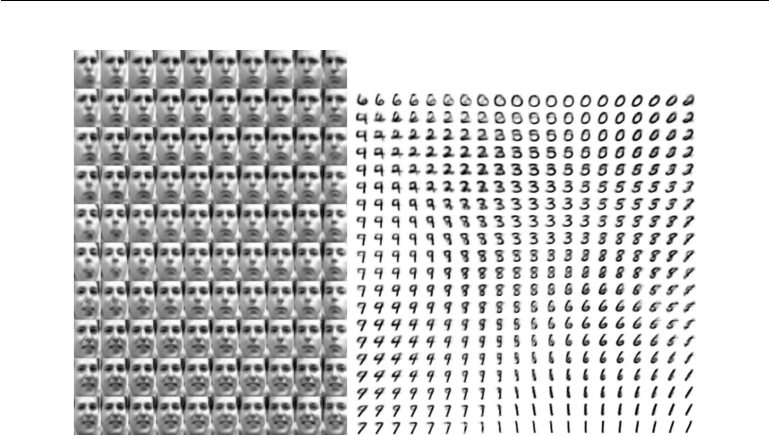

Let us move to the example:

In [14]:
train_set = MNIST(:train)
N, M = size(train_set.features, 3), 64
Y = train_set.targets
X = reshape(train_set.features,(28^2,N)) .≥ 0.5
data = [X[:,i] for i in Iterators.partition(1:N,M)] |> device;

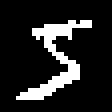

In [15]:
img(Float64.(X[:,1]))

Let us define a model:

In [16]:
Dz, Dh1, Dh2 = 2, 512, 256 #wymiary

(2, 512, 256)

In [17]:
common = Chain(Dense(28^2, Dh1, leakyrelu), Dense(Dh1,Dh2,leakyrelu)) 
μ = Dense(Dh2, Dz) 
lnσ = Dense(Dh2, Dz) 


struct Encoder
    common
    μ
    logσ
end

Flux.@layer Encoder

function (encoder::Encoder)(x)
    h = encoder.common(x)
    encoder.μ(h), encoder.logσ(h)
end

z(μ, logσ) = μ + exp.(logσ) .* device(randn(Float32,size(logσ)))

encoder = Encoder(common, μ, lnσ) |> device

decoder = Chain(Dense(Dz, Dh2, leakyrelu),
                Dense(Dh2,Dh1),
                Dense(Dh1, 28^2)) |> device


Chain(
  Dense(2 => 256, leakyrelu),           # 768 parameters
  Dense(256 => 512),                    # 131_584 parameters
  Dense(512 => 784),                    # 402_192 parameters
)                   # Total: 6 arrays, 534_544 parameters, 976 bytes.

and a loss function:

In [18]:
# KL-divergence between approximation posterior and N(0, 1) prior
kl_q_p(μ, logσ) = 0.5f0 * sum(@. (exp(2f0 * logσ) + μ^2 -1f0 - 2f0 * logσ))

kl_q_p (generic function with 1 method)

In [19]:
# logp(x|z) - conditional probability of data given latents.
logp_x_z(decoder, x, z) = -sum(Losses.logitbinarycrossentropy.(decoder(z), x))

logp_x_z (generic function with 1 method)

In [20]:
function ELBO(encoder, decoder, X)
    μ̂, logσ̂ = encoder(X)
    ẑ = z(μ̂, logσ̂ )
    (logp_x_z(decoder, X, ẑ) * 1 /size(X)[end]) - (kl_q_p(μ̂, logσ̂) * 1 /size(X)[end]) 
    
end

ELBO (generic function with 1 method)

In [21]:
 loss(encoder, decoder , X) = -ELBO(encoder, decoder, X)

loss (generic function with 2 methods)

In [22]:
 loss(encoder, decoder, data[1])

544.1304f0

Some auxiliary functions:

In [23]:
img(x::Vector) = Gray.(transpose(reshape(clamp.(x, 0, 1), 28, 28)))

function sample()
    batch = data[rand(1:length(data))]
    μ̂, logσ̂  = encoder(batch)
    Z = z(μ̂, logσ̂ )
    decoded = decoder(Z)
    idx = rand(1:size(batch,2),4)
    before = [img(Float64.(cpu(batch[:,i]))) for i in idx] 
    after = [img(cpu(decoded[:,i])) for i in idx]
    vcat(hcat.(before, after)...)
end

sample (generic function with 1 method)

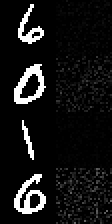

In [24]:
sample()

In [25]:
function scatter_plot(pltsize = 2000)
    plt = scatter(palette=:tab10)
    idxs = rand(1:size(X,2), pltsize)
    labels = Y[idxs]
    batch = X[:,idxs] |> device
    μs,_ = encoder(batch) |> cpu
    scatter!(μs[1, :], μs[2, :], 
            markerstrokewidth=0, markeralpha=0.8,
            aspect_ratio=1,
            markercolor=labels, label="")
end

scatter_plot (generic function with 2 methods)

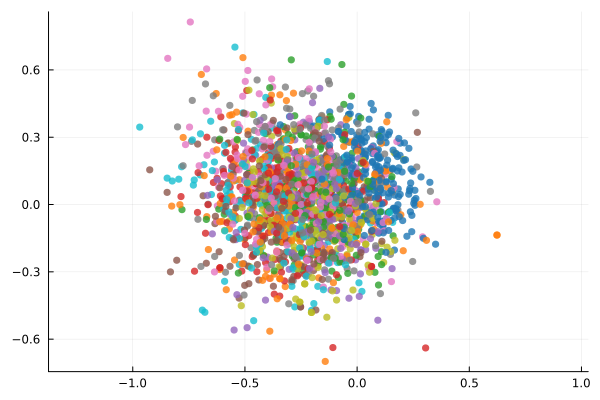

In [26]:
scatter_plot()

In [27]:
function manifold_plot(z = range(-2.0, stop=2.0, length=11))
    len = Base.length(z)
    z1 = repeat(z, len)
    z2 = sort(z1)
    input = hcat(z1,z2)' |> device
    samples = [decoder(input)[:,i] for i = 1:len^2] |> cpu
    samples = reshape(img.(samples), (len,len))
    vcat([hcat(samples[:,i]...) for i = 1:len]...)
end

manifold_plot (generic function with 2 methods)

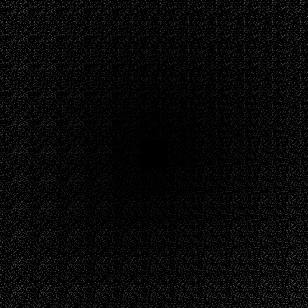

In [28]:
manifold_plot()

In [29]:
function display_plots()
    @show(loss(encoder, decoder, data[1]))
    display(scatter_plot())
    display(manifold_plot())
    display(sample())
end

display_plots (generic function with 1 method)

loss(encoder, decoder, data[1]) = 543.92267f0


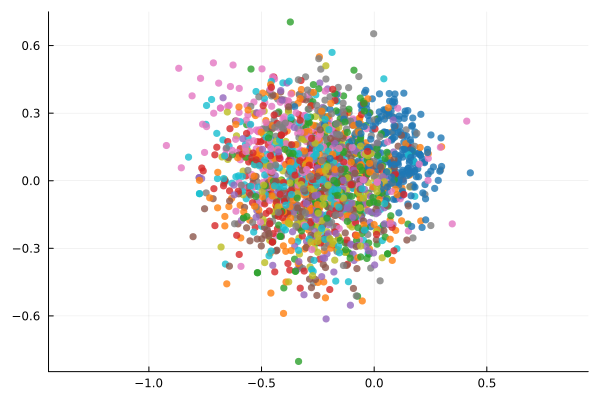

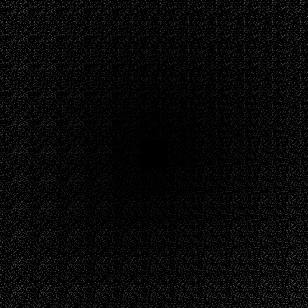

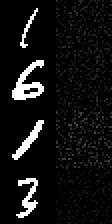

In [30]:
display_plots()

Now we can start a training process:

In [32]:
opt = Adam()
opt_state_enc = Flux.setup(opt, encoder);
opt_state_dec = Flux.setup(opt, decoder);

[ Info: Epoch 1


loss(encoder, decoder, data[1]) = 165.48541f0


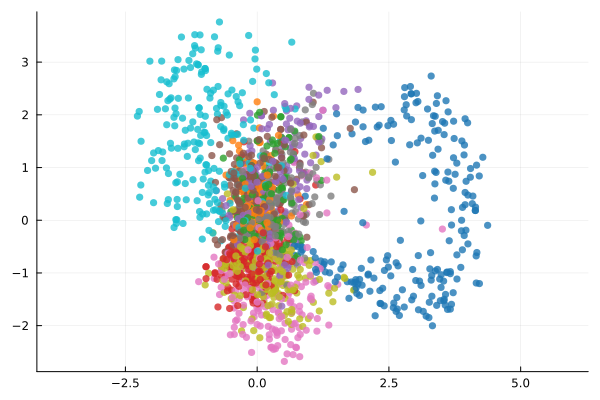

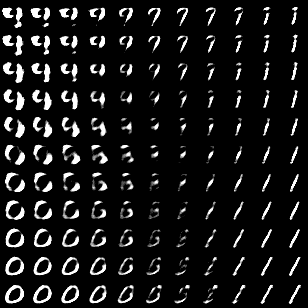

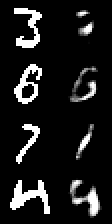

[ Info: Epoch 2


loss(encoder, decoder, data[1]) = 157.19235f0


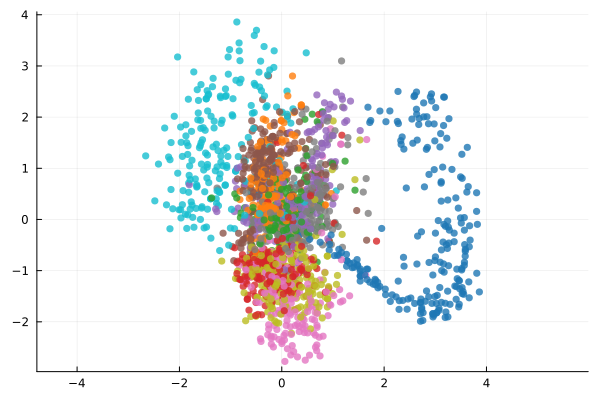

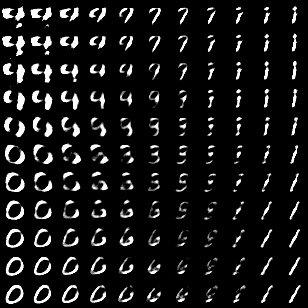

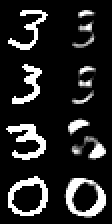

[ Info: Epoch 3


loss(encoder, decoder, data[1]) = 149.37468f0


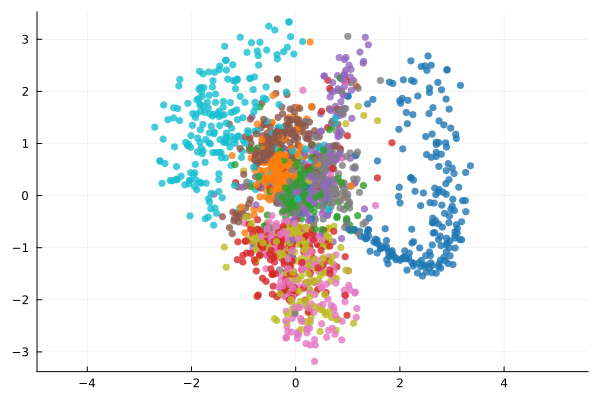

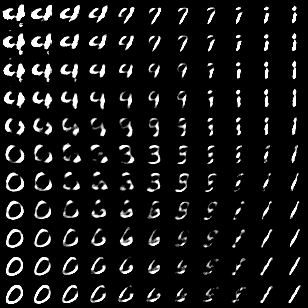

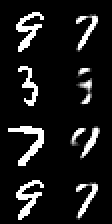

[ Info: Epoch 4


loss(encoder, decoder, data[1]) = 147.64551f0


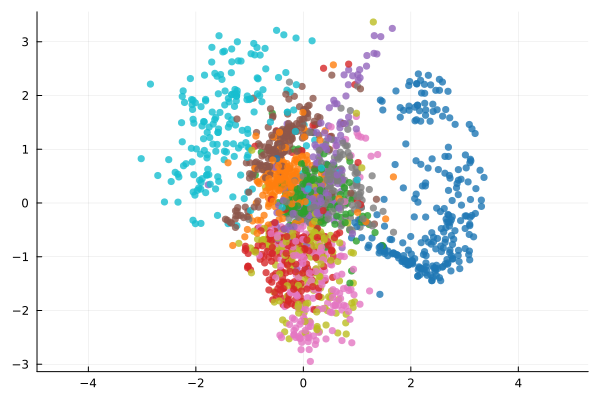

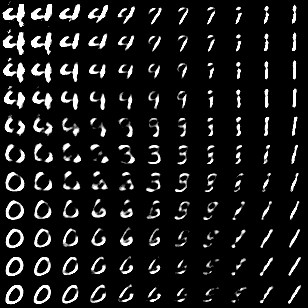

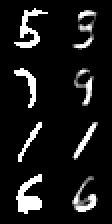

[ Info: Epoch 5


loss(encoder, decoder, data[1]) = 145.12909f0


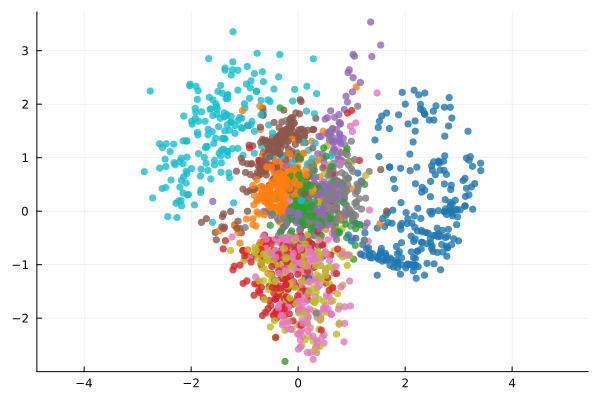

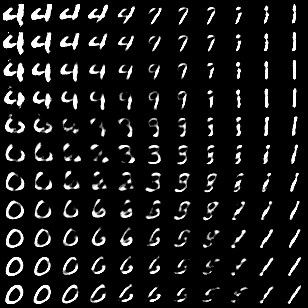

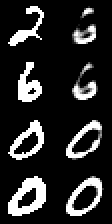

[ Info: Epoch 6


loss(encoder, decoder, data[1]) = 144.5121f0


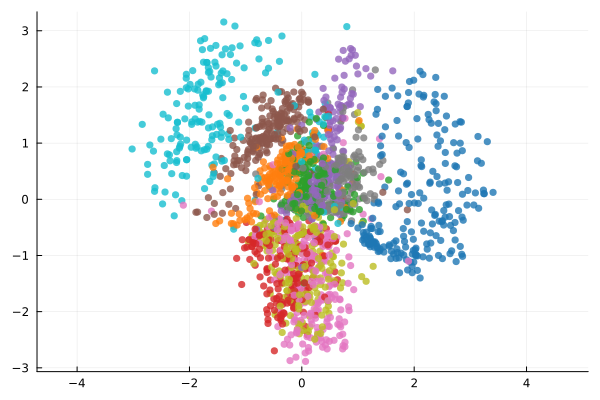

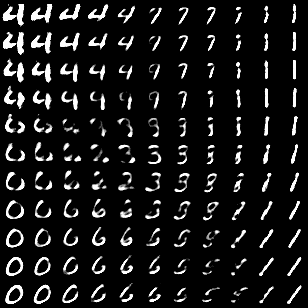

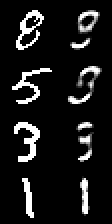

[ Info: Epoch 7


loss(encoder, decoder, data[1]) = 142.15723f0


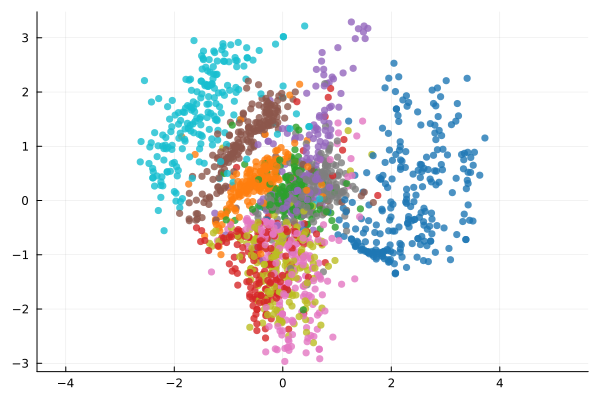

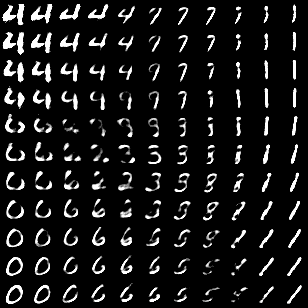

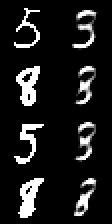

[ Info: Epoch 8


loss(encoder, decoder, data[1]) = 143.38828f0


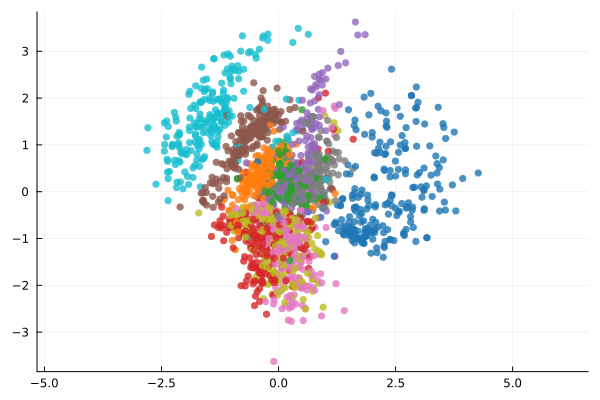

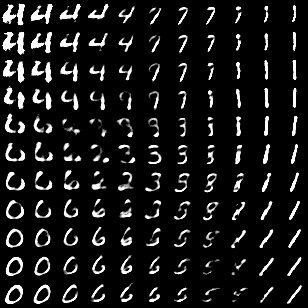

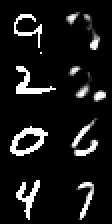

[ Info: Epoch 9


loss(encoder, decoder, data[1]) = 139.89555f0


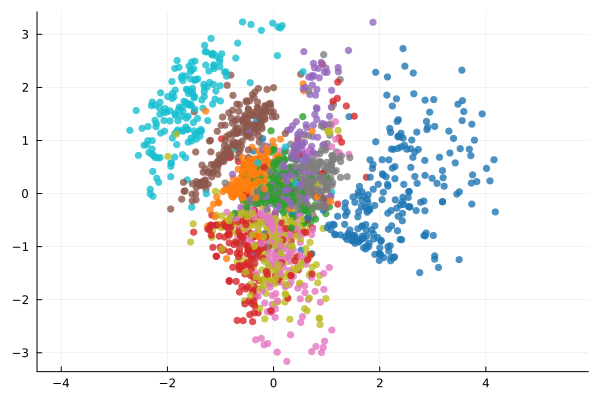

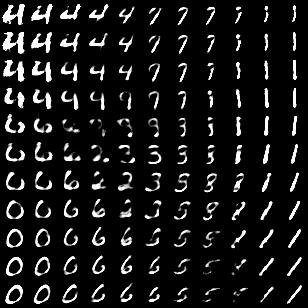

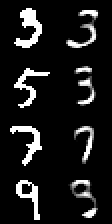

[ Info: Epoch 10


loss(encoder, decoder, data[1]) = 139.1935f0


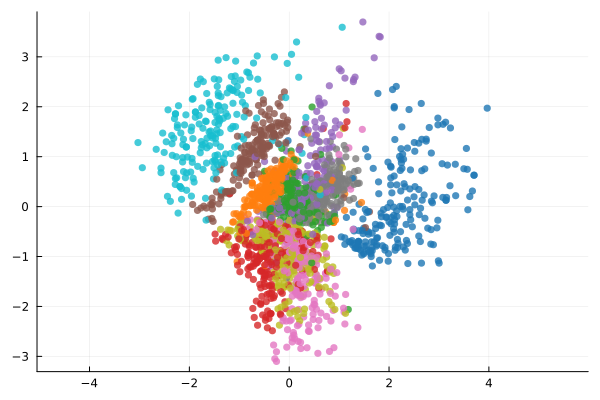

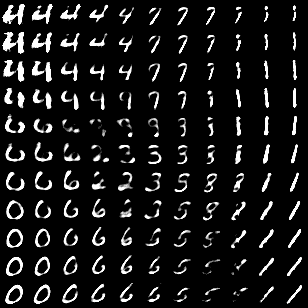

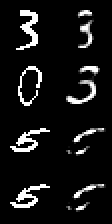

[ Info: Epoch 11


loss(encoder, decoder, data[1]) = 139.8695f0


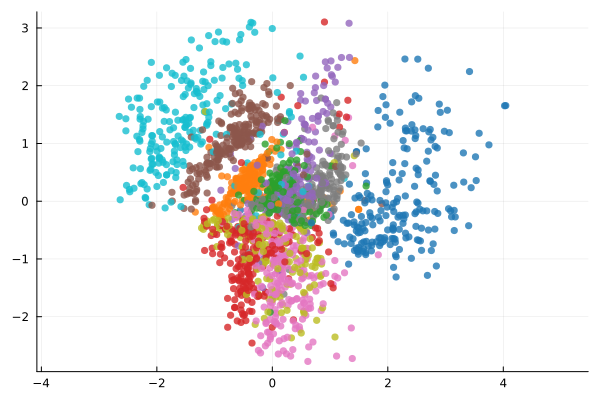

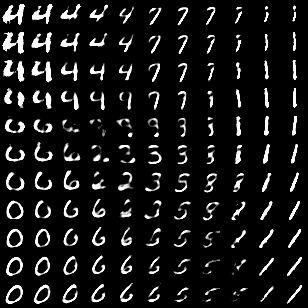

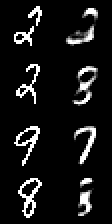

[ Info: Epoch 12


loss(encoder, decoder, data[1]) = 137.06363f0


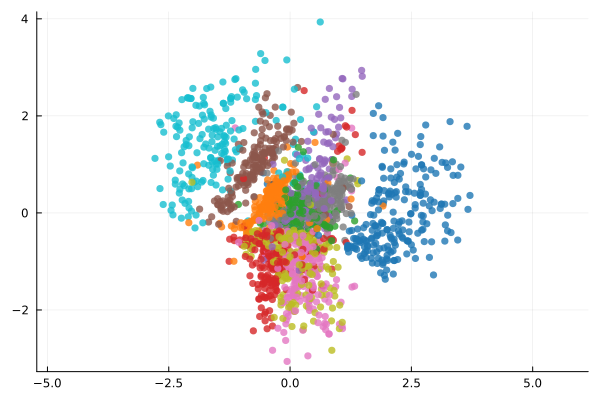

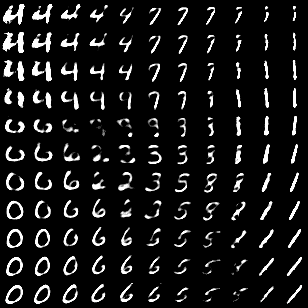

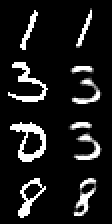

[ Info: Epoch 13


loss(encoder, decoder, data[1]) = 137.4733f0


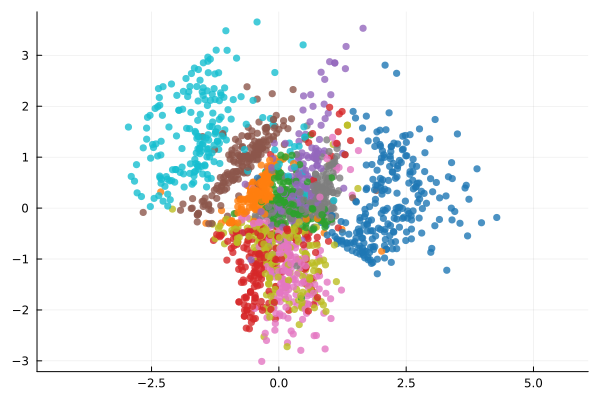

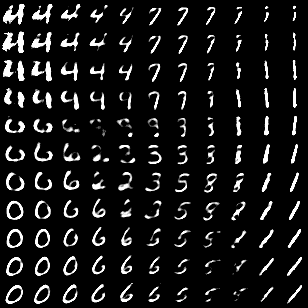

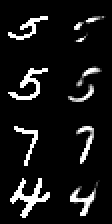

[ Info: Epoch 14


loss(encoder, decoder, data[1]) = 137.957f0


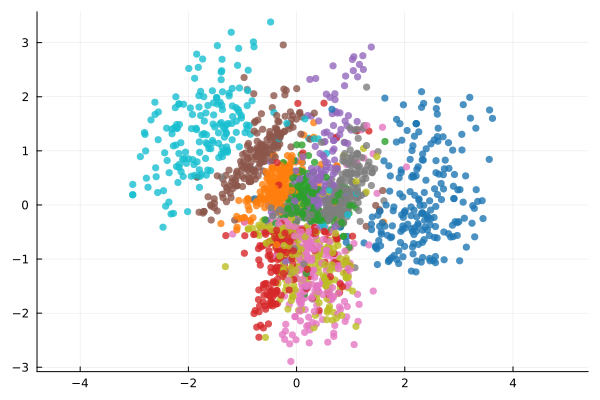

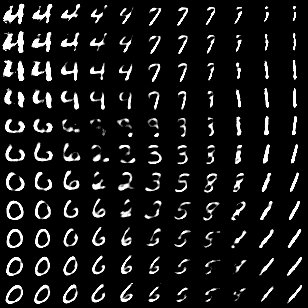

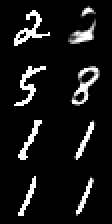

[ Info: Epoch 15


loss(encoder, decoder, data[1]) = 135.2265f0


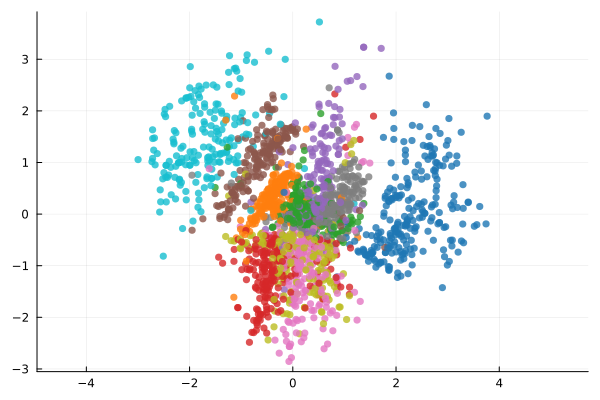

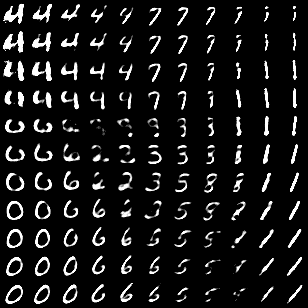

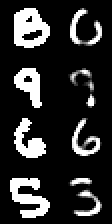

[ Info: Epoch 16


loss(encoder, decoder, data[1]) = 134.89682f0


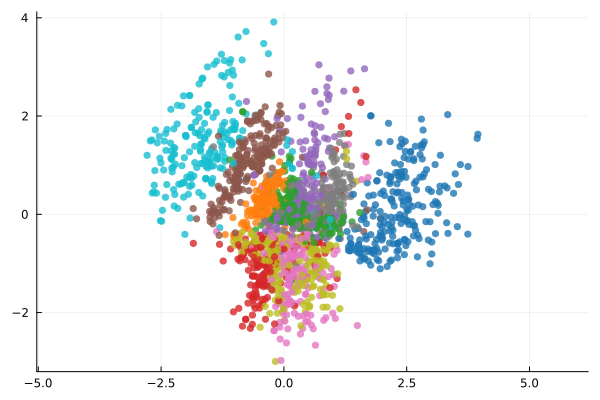

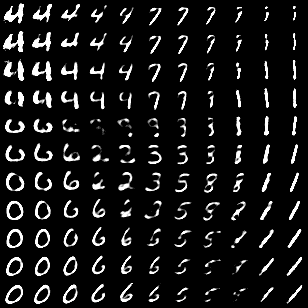

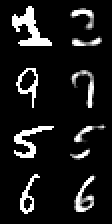

[ Info: Epoch 17


loss(encoder, decoder, data[1]) = 134.33163f0


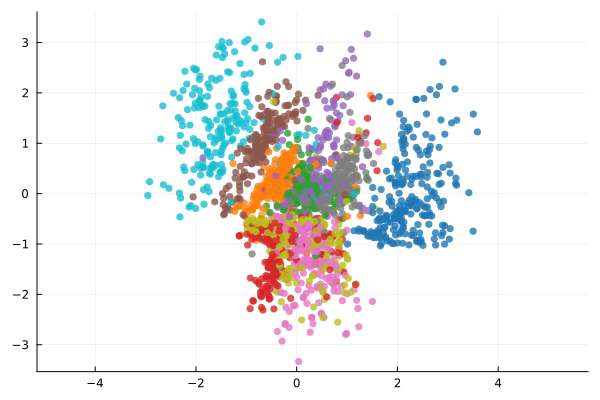

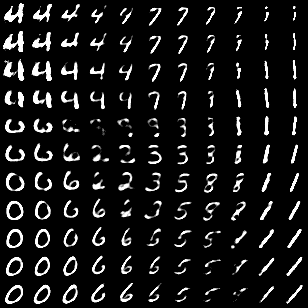

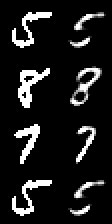

[ Info: Epoch 18


loss(encoder, decoder, data[1]) = 133.3523f0


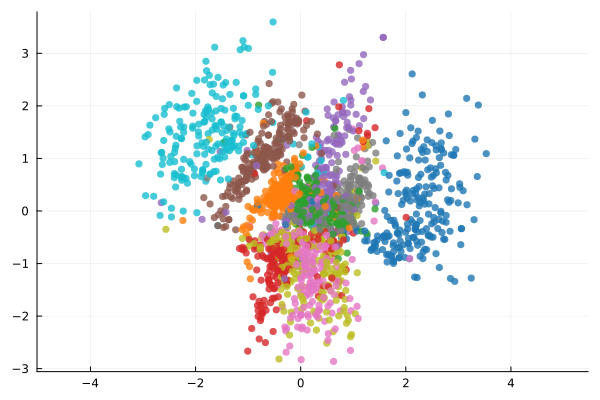

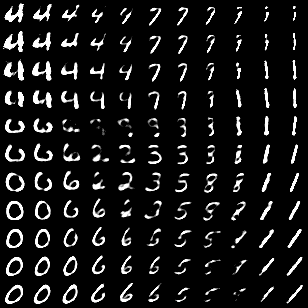

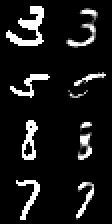

[ Info: Epoch 19


loss(encoder, decoder, data[1]) = 133.43817f0


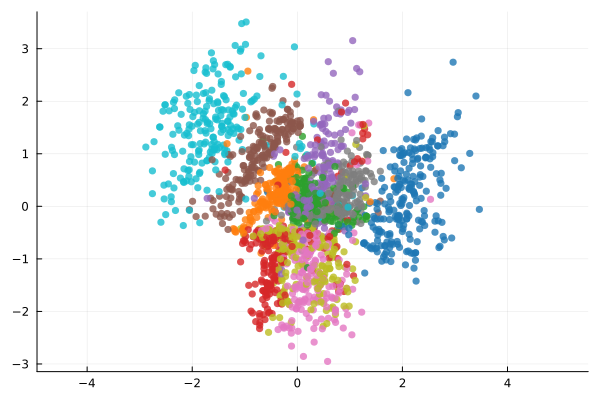

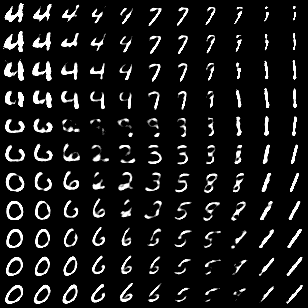

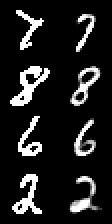

[ Info: Epoch 20


loss(encoder, decoder, data[1]) = 132.6162f0


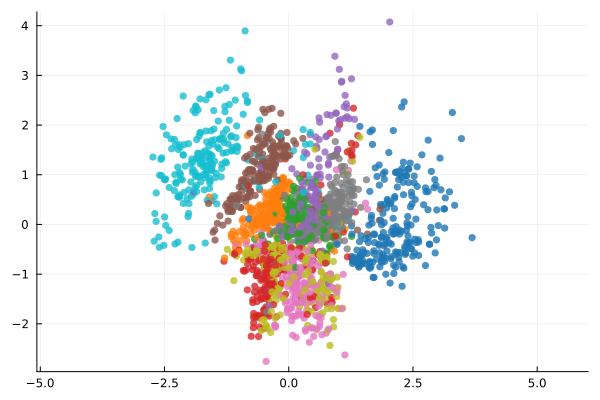

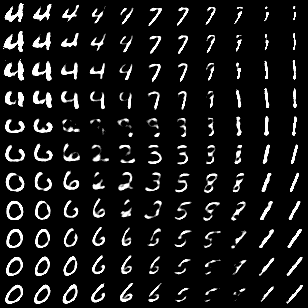

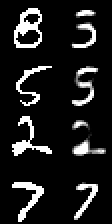

In [33]:
## @info("Beginning training loop...")
best_ls = Inf
last_improvement = 0
for epoch = 1:20
    @info "Epoch $epoch"
    global best_ls, last_improvement
    for batch in data 
        ls, (∇_enc, ∇_dec) = Flux.withgradient(encoder, decoder) do encoder, decoder
            loss(encoder, decoder, batch)
        end
        Flux.update!(opt_state_enc, encoder, ∇_enc)
        Flux.update!(opt_state_dec, decoder, ∇_dec)         
    end
    ls = loss(encoder, decoder, data[1])
    display_plots()
    if ls <= best_ls
        jldsave("vae.jld2"; encoder = cpu(Flux.state(encoder)),  decoder = cpu(Flux.state(decoder)))
        best_ls = ls
        last_improvement = epoch
    end
    if epoch - last_improvement >= 2
        @warn(" -> We're calling this converged.")
        break
    end
end

In [34]:
common = Chain(Dense(28^2, Dh1, leakyrelu), Dense(Dh1,Dh2,leakyrelu)) 
μ = Dense(Dh2, Dz) 
lnσ = Dense(Dh2, Dz) 


struct Encoder
    common
    μ
    logσ
end

Flux.@layer Encoder

function (encoder::Encoder)(x)
    h = encoder.common(x)
    encoder.μ(h), encoder.logσ(h)
end

z(μ, logσ) = μ + exp.(logσ) .* device(randn(Float32,size(logσ)))

encoder = Encoder(common, μ, lnσ) |> device

decoder = Chain(Dense(Dz, Dh2, leakyrelu),
                Dense(Dh2,Dh1),
                Dense(Dh1, 28^2)) |> device

model_params = JLD2.load("vae.jld2")

Flux.loadmodel!(encoder, device(model_params["encoder"]))
Flux.loadmodel!(decoder, device(model_params["decoder"]))


Chain(
  Dense(2 => 256, leakyrelu),           # 768 parameters
  Dense(256 => 512),                    # 131_584 parameters
  Dense(512 => 784),                    # 402_192 parameters
)                   # Total: 6 arrays, 534_544 parameters, 976 bytes.

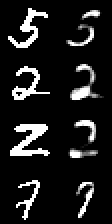

In [35]:
sample()

## Extra homework

1. Prove that the Kullback-Leibler divergence for two normal distributions: $\mathcal{N}(\mu,\sigma)$ and $\mathcal{N}(0,1)$ is equal to:

$$d_{KL}(\mathcal{N}(\mu,\sigma)||\mathcal{N}(0,1)) = \frac{1}{2}(\sigma^2 + \mu^2  - 1 - 2\log\sigma) $$ <b>(5 points)</b>

